<a href="https://colab.research.google.com/github/lefthandedpony/googleColab_1234_smart_graphics/blob/main/notebooks/Image_Search_CLIP.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## References:
* [Beyond tags and entering the semantic search era on images with OpenAI CLIP](https://towardsdatascience.com/beyond-tags-and-entering-the-semantic-search-era-on-images-with-openai-clip-1f7d629a9978)
* [HuggingFace CLIP Documentation](https://huggingface.co/transformers/model_doc/clip.html)

## Initial setup

In [2]:
!pip install -q transformers ipyplot==1.1.0 ftfy

In [3]:
from io import BytesIO
from PIL import Image
import requests
import ipyplot

from transformers import CLIPProcessor, CLIPModel
import torch

In [4]:
model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(
Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


## Setup search query

In [3]:
import gdown
from zipfile import ZipFile
from PIL import Image
from io import BytesIO

# Lade das ZIP von Google Drive
url = 'https://drive.google.com/uc?id=1f2he9Ipx_SI_aAmrpEhfjKfrm7POuJti'
local_zip = 'travel_images.zip'
gdown.download(url, local_zip, quiet=False)

# Extrahiere Bilder
all_images = []
with ZipFile(local_zip, 'r') as zip_ref:
    for file_name in zip_ref.namelist():
        if file_name.lower().endswith(('jpg', 'jpeg', 'png')):
            with zip_ref.open(file_name) as file:
                img = Image.open(BytesIO(file.read())).convert('RGB')
                all_images.append(img)

print("Anzahl geladener Bilder:", len(all_images))


Downloading...
From (original): https://drive.google.com/uc?id=1f2he9Ipx_SI_aAmrpEhfjKfrm7POuJti
From (redirected): https://drive.google.com/uc?id=1f2he9Ipx_SI_aAmrpEhfjKfrm7POuJti&confirm=t&uuid=36de3b18-1209-4e58-8881-2b59a7504aed
To: /content/travel_images.zip
100%|██████████| 185M/185M [00:01<00:00, 167MB/s]


Anzahl geladener Bilder: 3600


In [5]:
#@title Enter the queries
semantic_search_phrases = [
    "Sonnenblumenfeld",
]


Top Scores für: Sonnenblumenfeld
[28.532, 27.096, 26.828, 26.743, 26.151]



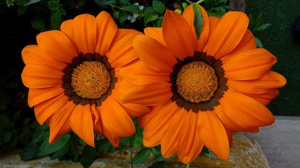
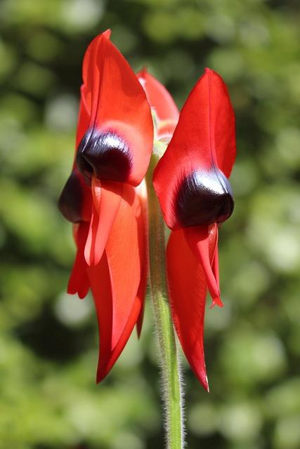
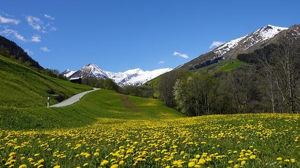
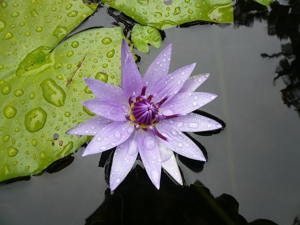
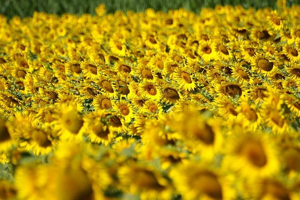


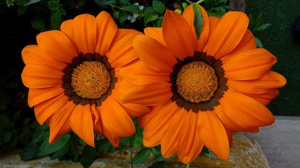
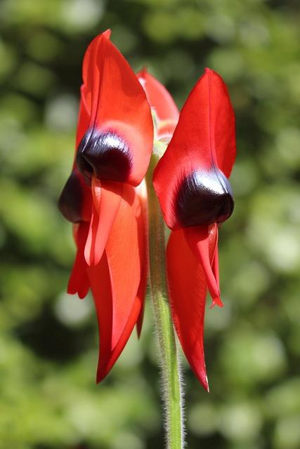
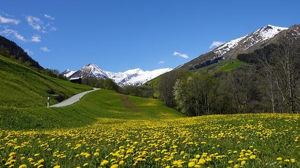
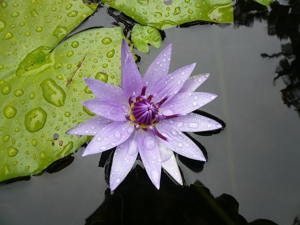
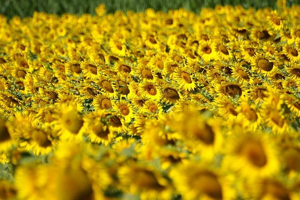

In [9]:
import torch
from transformers import CLIPProcessor, CLIPModel
import ipyplot

# Modell laden (falls noch nicht passiert)
model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")

# Beispiel-Phrase
semantic_search_phrase = "Sonnenblumenfeld"

batch_size = 50
all_results = []

for i in range(0, len(all_images), batch_size):
    batch = all_images[i:i+batch_size]

    # Text und Bilder verarbeiten
    inputs = processor(text=[semantic_search_phrase], images=batch, return_tensors="pt", padding=True)

    with torch.no_grad():
        outputs = model(**inputs)

    scores = outputs.logits_per_image.squeeze()  # Scores für diesen Batch
    for score, img in zip(scores, batch):
        all_results.append((score.item(), img))

# 🔝 Sortiere nach Ähnlichkeit (höchster Score zuerst)
all_results.sort(reverse=True, key=lambda x: x[0])

# ✅ Top-N anzeigen (z. B. die besten 5)
top_n = 5
top_images = [img for _, img in all_results[:top_n]]
top_scores = [round(score, 3) for score, _ in all_results[:top_n]]

# 📊 Ausgabe
print(f"Top Scores für: {semantic_search_phrase}")
print(top_scores)
ipyplot.plot_images(top_images, img_width=300)


Top Scores für: Kulinarische Köstlichkeiten
[27.064, 26.963, 26.715, 26.685, 26.327]



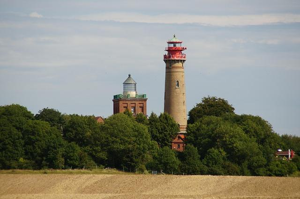
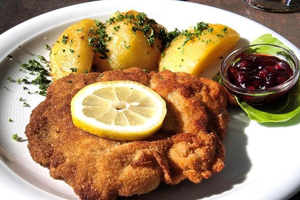
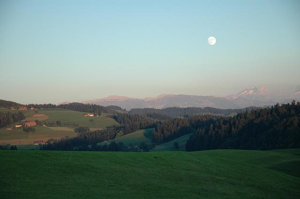
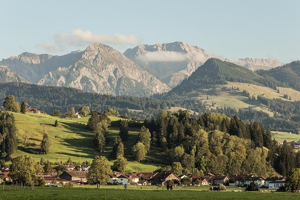
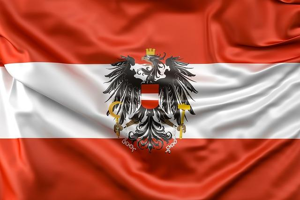


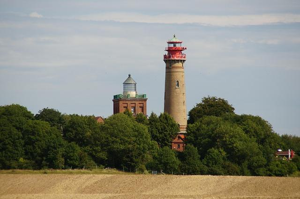
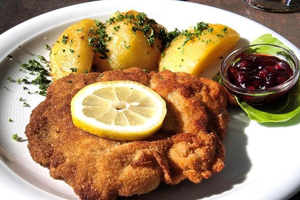
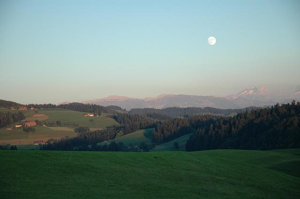
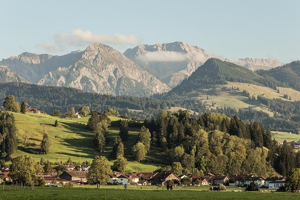
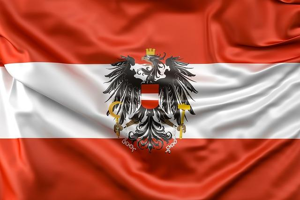

In [11]:
import torch
from transformers import CLIPProcessor, CLIPModel
import ipyplot

# Modell laden (falls noch nicht passiert)
model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")

# Beispiel-Phrase
semantic_search_phrase = "Kulinarische Köstlichkeiten"

batch_size = 50
all_results = []

for i in range(0, len(all_images), batch_size):
    batch = all_images[i:i+batch_size]

    # Text und Bilder verarbeiten
    inputs = processor(text=[semantic_search_phrase], images=batch, return_tensors="pt", padding=True)

    with torch.no_grad():
        outputs = model(**inputs)

    scores = outputs.logits_per_image.squeeze()  # Scores für diesen Batch
    for score, img in zip(scores, batch):
        all_results.append((score.item(), img))

# 🔝 Sortiere nach Ähnlichkeit (höchster Score zuerst)
all_results.sort(reverse=True, key=lambda x: x[0])

# ✅ Top-N anzeigen (z. B. die besten 5)
top_n = 5
top_images = [img for _, img in all_results[:top_n]]
top_scores = [round(score, 3) for score, _ in all_results[:top_n]]

# 📊 Ausgabe
print(f"Top Scores für: {semantic_search_phrase}")
print(top_scores)
ipyplot.plot_images(top_images, img_width=300)


Top Scores für: London
[29.874, 29.564, 29.524, 29.407, 29.395]



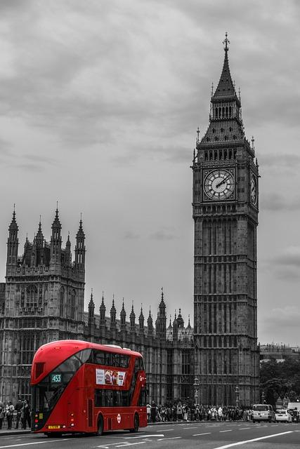
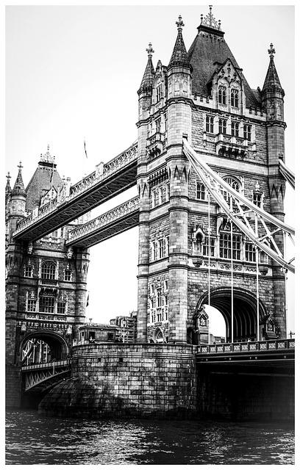
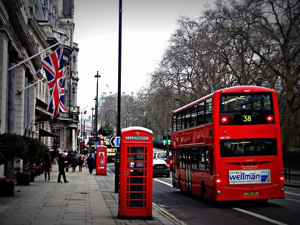
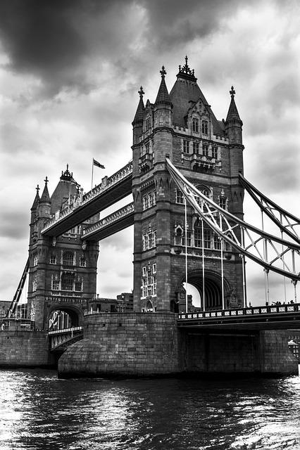
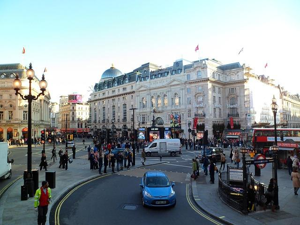


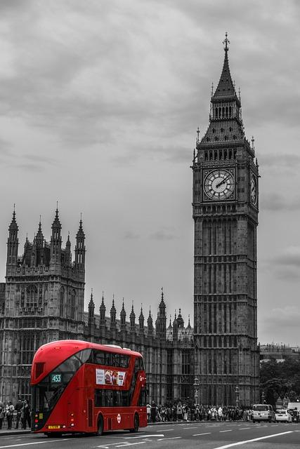
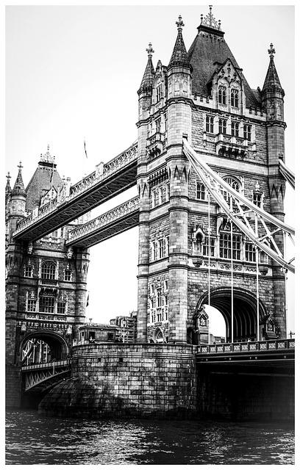
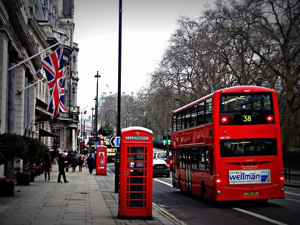
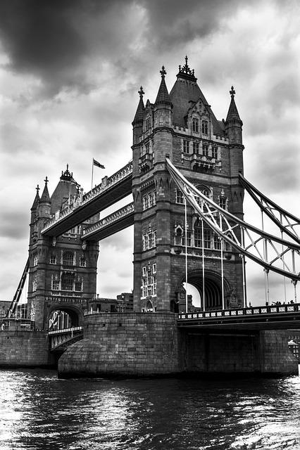
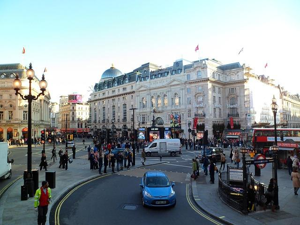

In [12]:
import torch
from transformers import CLIPProcessor, CLIPModel
import ipyplot

# Modell laden (falls noch nicht passiert)
model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")

# Beispiel-Phrase
semantic_search_phrase = "London"

batch_size = 50
all_results = []

for i in range(0, len(all_images), batch_size):
    batch = all_images[i:i+batch_size]

    # Text und Bilder verarbeiten
    inputs = processor(text=[semantic_search_phrase], images=batch, return_tensors="pt", padding=True)

    with torch.no_grad():
        outputs = model(**inputs)

    scores = outputs.logits_per_image.squeeze()  # Scores für diesen Batch
    for score, img in zip(scores, batch):
        all_results.append((score.item(), img))

# 🔝 Sortiere nach Ähnlichkeit (höchster Score zuerst)
all_results.sort(reverse=True, key=lambda x: x[0])

# ✅ Top-N anzeigen (z. B. die besten 5)
top_n = 5
top_images = [img for _, img in all_results[:top_n]]
top_scores = [round(score, 3) for score, _ in all_results[:top_n]]

# 📊 Ausgabe
print(f"Top Scores für: {semantic_search_phrase}")
print(top_scores)
ipyplot.plot_images(top_images, img_width=300)

Top Scores für: Die Muschel am Strand
[31.306, 30.59, 29.958, 29.484, 29.336]



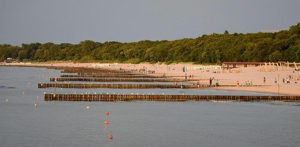
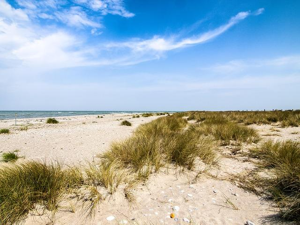
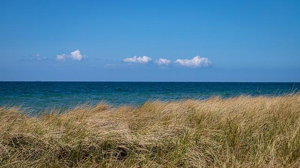
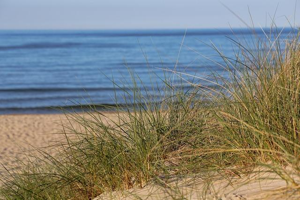
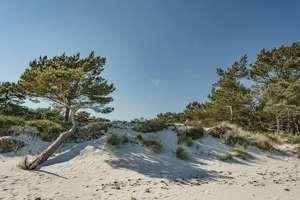


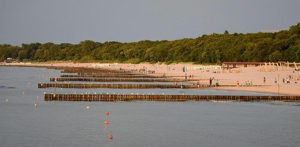
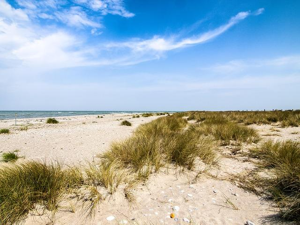
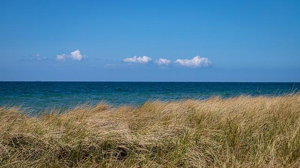
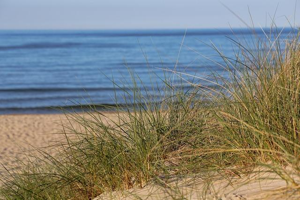
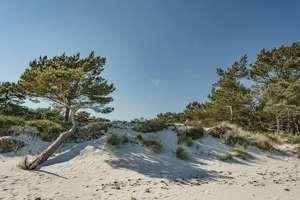

In [13]:
import torch
from transformers import CLIPProcessor, CLIPModel
import ipyplot

# Modell laden (falls noch nicht passiert)
model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")

# Beispiel-Phrase
semantic_search_phrase = "Die Muschel am Strand"

batch_size = 50
all_results = []

for i in range(0, len(all_images), batch_size):
    batch = all_images[i:i+batch_size]

    # Text und Bilder verarbeiten
    inputs = processor(text=[semantic_search_phrase], images=batch, return_tensors="pt", padding=True)

    with torch.no_grad():
        outputs = model(**inputs)

    scores = outputs.logits_per_image.squeeze()  # Scores für diesen Batch
    for score, img in zip(scores, batch):
        all_results.append((score.item(), img))

# 🔝 Sortiere nach Ähnlichkeit (höchster Score zuerst)
all_results.sort(reverse=True, key=lambda x: x[0])

# ✅ Top-N anzeigen (z. B. die besten 5)
top_n = 5
top_images = [img for _, img in all_results[:top_n]]
top_scores = [round(score, 3) for score, _ in all_results[:top_n]]

# 📊 Ausgabe
print(f"Top Scores für: {semantic_search_phrase}")
print(top_scores)
ipyplot.plot_images(top_images, img_width=300)

Top Scores für: Kühe in den Bergen
[29.264, 29.11, 29.065, 28.29, 28.26]



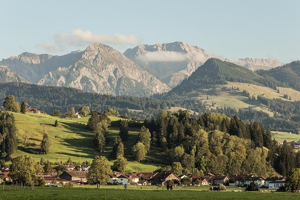
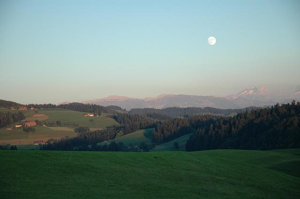
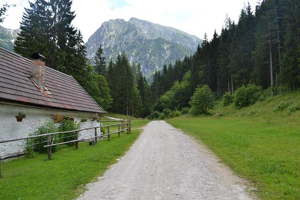
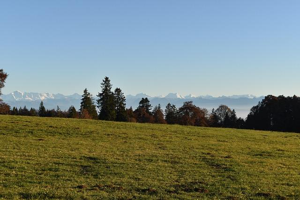
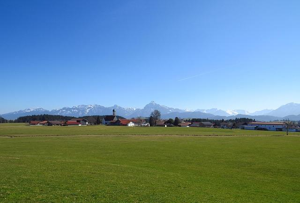


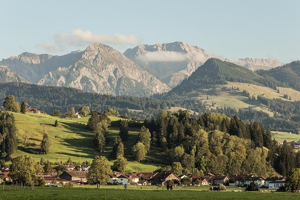
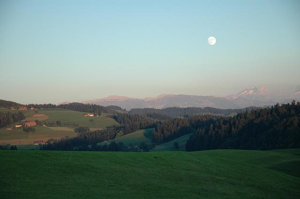
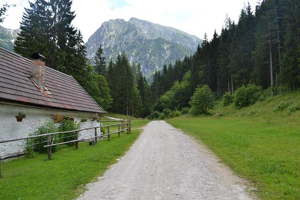
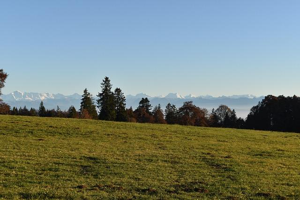
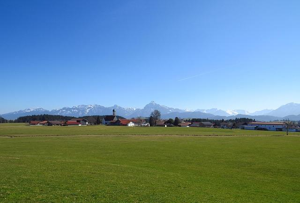

In [14]:
import torch
from transformers import CLIPProcessor, CLIPModel
import ipyplot

# Modell laden (falls noch nicht passiert)
model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")

# Beispiel-Phrase
semantic_search_phrase = "Kühe in den Bergen"

batch_size = 50
all_results = []

for i in range(0, len(all_images), batch_size):
    batch = all_images[i:i+batch_size]

    # Text und Bilder verarbeiten
    inputs = processor(text=[semantic_search_phrase], images=batch, return_tensors="pt", padding=True)

    with torch.no_grad():
        outputs = model(**inputs)

    scores = outputs.logits_per_image.squeeze()  # Scores für diesen Batch
    for score, img in zip(scores, batch):
        all_results.append((score.item(), img))

# 🔝 Sortiere nach Ähnlichkeit (höchster Score zuerst)
all_results.sort(reverse=True, key=lambda x: x[0])

# ✅ Top-N anzeigen (z. B. die besten 5)
top_n = 5
top_images = [img for _, img in all_results[:top_n]]
top_scores = [round(score, 3) for score, _ in all_results[:top_n]]

# 📊 Ausgabe
print(f"Top Scores für: {semantic_search_phrase}")
print(top_scores)
ipyplot.plot_images(top_images, img_width=300)

In [16]:
import gdown
from zipfile import ZipFile
from PIL import Image
from io import BytesIO

# Deine Google Drive ZIP-Link-ID einfügen
file_id = "1DKHVC3e5sTAZYL2BAaIosxzaOTr-YH6p"  # <- deine eigene
url = f"https://drive.google.com/uc?id={file_id}"

# Download
gdown.download(url, 'my_images.zip', quiet=False)

all_images = []
with ZipFile('my_images.zip', 'r') as zip_ref:
    for file_name in zip_ref.namelist():
        if file_name.lower().endswith(('png', 'jpg', 'jpeg')):
            with zip_ref.open(file_name) as file:
                img = Image.open(BytesIO(file.read())).convert("RGB")
                all_images.append(img)

print("✅ Bilder geladen:", len(all_images))

Downloading...
From: https://drive.google.com/uc?id=1DKHVC3e5sTAZYL2BAaIosxzaOTr-YH6p
To: /content/my_images.zip
100%|██████████| 6.69M/6.69M [00:00<00:00, 24.6MB/s]


✅ Bilder geladen: 101


In [6]:
import gdown
from zipfile import ZipFile
from PIL import Image
from io import BytesIO

# Lade das ZIP von Google Drive
url = 'https://drive.google.com/uc?id=1DKHVC3e5sTAZYL2BAaIosxzaOTr-YH6p'
local_zip = 'my_bilder.zip'
gdown.download(url, local_zip, quiet=False)

# Extrahiere Bilder
all_images = []
with ZipFile(local_zip, 'r') as zip_ref:
    for file_name in zip_ref.namelist():
        if file_name.lower().endswith(('jpg', 'jpeg', 'png')):
            with zip_ref.open(file_name) as file:
                img = Image.open(BytesIO(file.read())).convert('RGB')
                all_images.append(img)

print("Anzahl geladener Bilder:", len(all_images))


Downloading...
From: https://drive.google.com/uc?id=1DKHVC3e5sTAZYL2BAaIosxzaOTr-YH6p
To: /content/my_bilder.zip
100%|██████████| 6.69M/6.69M [00:00<00:00, 30.5MB/s]


Anzahl geladener Bilder: 101


Top Scores für: Grüne Bäume in den Bergen
[27.211, 26.735, 26.531, 26.136, 25.606]



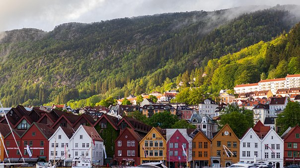
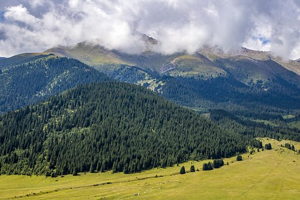
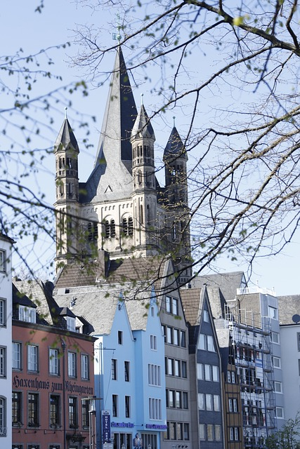
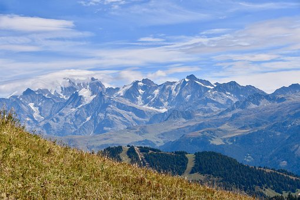
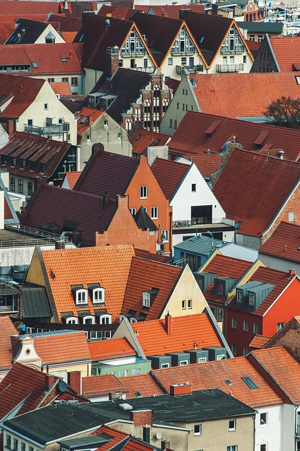


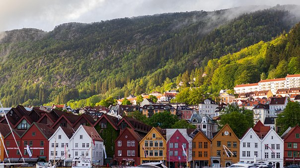
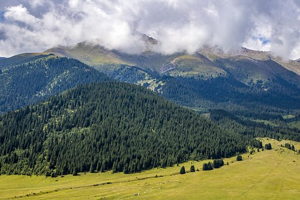
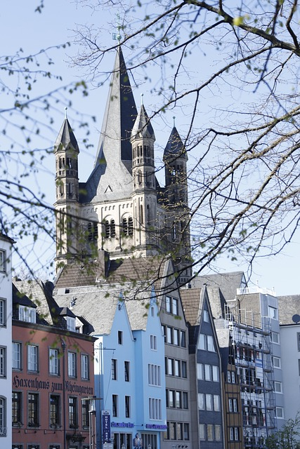
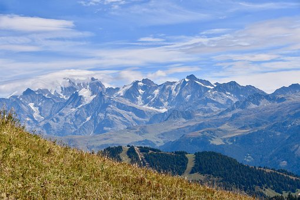
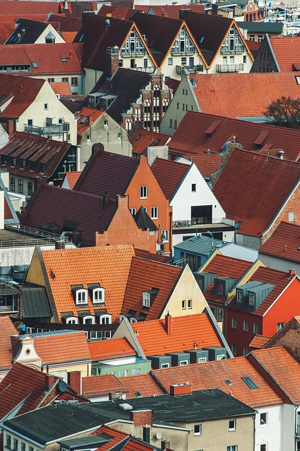

In [40]:
import torch
from transformers import CLIPProcessor, CLIPModel
import ipyplot

# Modell laden (falls noch nicht passiert)
model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")

# Beispiel-Phrase
semantic_search_phrase = "Grüne Bäume in den Bergen"

batch_size = 50
all_results = []

for i in range(0, len(all_images), batch_size):
    batch = all_images[i:i+batch_size]

    # Text und Bilder verarbeiten
    inputs = processor(text=[semantic_search_phrase], images=batch, return_tensors="pt", padding=True)

    with torch.no_grad():
        outputs = model(**inputs)

    scores = outputs.logits_per_image.squeeze()

    # Ensure scores is at least 1-dimensional for iteration
    if scores.dim() == 0:
      scores = scores.unsqueeze(0)

    for score, img in zip(scores, batch):
        all_results.append((score.item(), img))


# 🔝 Sortiere nach Ähnlichkeit (höchster Score zuerst)
all_results.sort(reverse=True, key=lambda x: x[0])

# ✅ Top-N anzeigen (z. B. die besten 5)
top_n = 5
top_images = [img for _, img in all_results[:top_n]]
top_scores = [round(score, 3) for score, _ in all_results[:top_n]]

# 📊 Ausgabe
print(f"Top Scores für: {semantic_search_phrase}")
print(top_scores)
ipyplot.plot_images(top_images, img_width=300)

Saving gorch-fock-3681409_640.jpg to gorch-fock-3681409_640.jpg
Scores: [0.762, 0.713, 0.704, 0.694, 0.693]



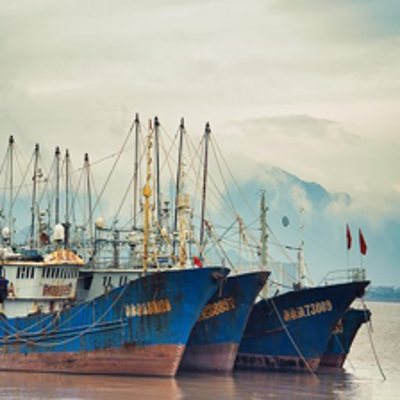
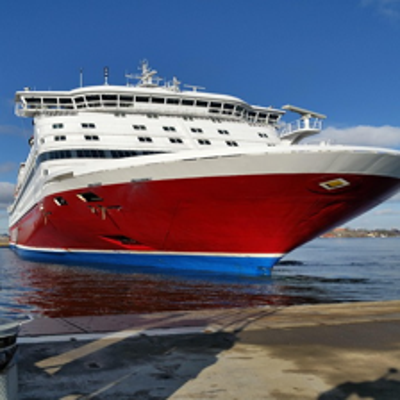
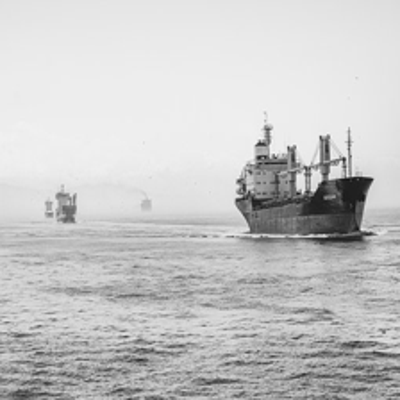
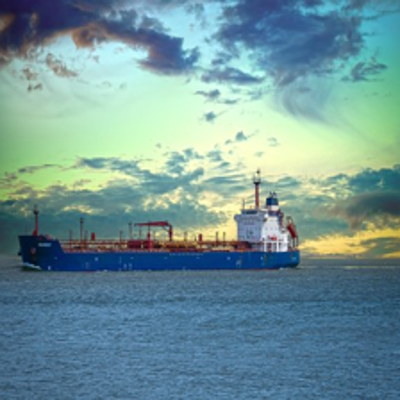
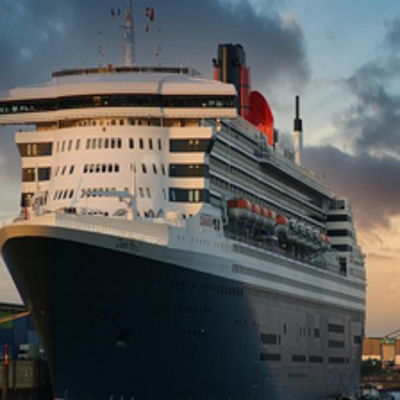

In [12]:
from google.colab import files
from PIL import Image
import torch
from sklearn.metrics.pairwise import cosine_similarity
import ipyplot
from PIL import Image

# 🔁 Deine Bildsammlung (wird vorausgesetzt)
# all_images = [...]  # <- Liste mit bereits geladenen Bildern

# 🖼️ Ein einzelnes Bild hochladen
uploaded = files.upload()
example_path = next(iter(uploaded))  # Nimmt den ersten Dateinamen
example_image = Image.open(example_path).convert("RGB")

# 🔢 1. Embedding für das Beispielbild berechnen
with torch.no_grad():
    inputs = processor(images=[example_image], return_tensors="pt", padding=True)
    example_embed = model.get_image_features(**inputs)  # (1, 512)

# 🔢 2. Embeddings für die Sammlung berechnen
batch_size = 50
collection_embeds = []

for i in range(0, len(all_images), batch_size):
    batch = all_images[i:i+batch_size]
    with torch.no_grad():
        batch_inputs = processor(images=batch, return_tensors="pt", padding=True)
        features = model.get_image_features(**batch_inputs)
        collection_embeds.append(features)

collection_embeds = torch.cat(collection_embeds, dim=0)  # (n_images, 512)

# 🔎 3. Ähnlichkeitsberechnung
sims = cosine_similarity(example_embed.cpu().numpy(), collection_embeds.cpu().numpy())[0]
top_idx = sims.argsort()[::-1][:5]  # Top 5 ähnlichste Bilder

top_imgs = [all_images[j] for j in top_idx]
top_scores = [round(float(sims[j]), 3) for j in top_idx]

# 📊 Ausgabe
top_imgs_resized = [img.resize((224, 224)) for img in top_imgs]


print("Scores:", top_scores)
ipyplot.plot_images(top_imgs_resized, img_width=200)